In [150]:
import datetime
import os
import re
import warnings
import zipfile

import folium
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
import seaborn as sns
from matplotlib import pyplot as plt
from plotly.subplots import make_subplots
from sklearn import linear_model, preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import make_scorer, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import DecisionTreeRegressor

warnings.filterwarnings("ignore")


In [151]:
from pathlib import Path
path_folder = Path("/Users/keithlowton/Desktop/Ks/Python code/Kaggle/Taxi Trajectory Prediction")
print(path_folder.exists())

True


### Read in the data

In [152]:
zip_file_sample = zipfile.ZipFile(os.path.join(path_folder, "data/sampleSubmission.csv.zip"))
zip_file_train = zipfile.ZipFile(os.path.join(path_folder, "data/train.csv.zip"))
zip_file_test = zipfile.ZipFile(os.path.join(path_folder, "data/test.csv.zip"))
zip_file_GPSlocation = zipfile.ZipFile(
    os.path.join(path_folder, "data/metaData_taxistandsID_name_GPSlocation.csv.zip")
)

# Converting Files To Pandas Dataframe
sample = pd.read_csv(zip_file_sample.open("sampleSubmission.csv"))
train = pd.read_csv(zip_file_train.open("train.csv"))
test = pd.read_csv(zip_file_test.open("test.csv"))
location = pd.read_csv(zip_file_GPSlocation.open("metaData_taxistandsID_name_GPSlocation.csv"))


In [153]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1710670 entries, 0 to 1710669
Data columns (total 9 columns):
 #   Column        Dtype  
---  ------        -----  
 0   TRIP_ID       int64  
 1   CALL_TYPE     object 
 2   ORIGIN_CALL   float64
 3   ORIGIN_STAND  float64
 4   TAXI_ID       int64  
 5   TIMESTAMP     int64  
 6   DAY_TYPE      object 
 7   MISSING_DATA  bool   
 8   POLYLINE      object 
dtypes: bool(1), float64(2), int64(3), object(3)
memory usage: 106.0+ MB


In [154]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320 entries, 0 to 319
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   TRIP_ID       320 non-null    object 
 1   CALL_TYPE     320 non-null    object 
 2   ORIGIN_CALL   72 non-null     float64
 3   ORIGIN_STAND  123 non-null    float64
 4   TAXI_ID       320 non-null    int64  
 5   TIMESTAMP     320 non-null    int64  
 6   DAY_TYPE      320 non-null    object 
 7   MISSING_DATA  320 non-null    bool   
 8   POLYLINE      320 non-null    object 
dtypes: bool(1), float64(2), int64(2), object(4)
memory usage: 20.4+ KB


In [155]:
nonvar_lst = []

for i in range(train.shape[1]):
    print("Column: ", train.columns[i], ", number of unique classes: ", train.iloc[:,i].nunique())
    if train.iloc[:,i].nunique() < 50:
        print("Values: ", list(set(train.iloc[:,i])))
    if train.iloc[:,i].nunique() == 1:
        nonvar_lst.append(train.columns[i])

Column:  TRIP_ID , number of unique classes:  1710589
Column:  CALL_TYPE , number of unique classes:  3
Values:  ['B', 'C', 'A']
Column:  ORIGIN_CALL , number of unique classes:  57105
Column:  ORIGIN_STAND , number of unique classes:  63
Column:  TAXI_ID , number of unique classes:  448
Column:  TIMESTAMP , number of unique classes:  1655366
Column:  DAY_TYPE , number of unique classes:  1
Values:  ['A']
Column:  MISSING_DATA , number of unique classes:  2
Values:  [False, True]
Column:  POLYLINE , number of unique classes:  1703650


In [156]:
print(nonvar_lst)

['DAY_TYPE']


### Missing data

In [157]:
check = train.isnull().sum()
check = pd.DataFrame(check)
check.columns = ["Count"]
check["perc"] = check.Count/train.shape[0]*100
check

,Count,perc
TRIP_ID,0,0.000000
CALL_TYPE,0,0.000000
ORIGIN_CALL,1345900,78.676776
ORIGIN_STAND,904091,52.850111
TAXI_ID,0,0.000000
TIMESTAMP,0,0.000000
DAY_TYPE,0,0.000000
MISSING_DATA,0,0.000000
POLYLINE,0,0.000000


In [158]:
check = test.isnull().sum()
check = pd.DataFrame(check)
check.columns = ["Count"]
check["perc"] = check.Count/test.shape[0]*100
check

,Count,perc
TRIP_ID,0,0.0000
CALL_TYPE,0,0.0000
ORIGIN_CALL,248,77.5000
ORIGIN_STAND,197,61.5625
TAXI_ID,0,0.0000
TIMESTAMP,0,0.0000
DAY_TYPE,0,0.0000
MISSING_DATA,0,0.0000
POLYLINE,0,0.0000


### Adjust the training set

In [159]:
train['ORIGIN_CALL'].value_counts()

2002.0     57571
63882.0     6406
2001.0      2499
13168.0     1314
6728.0      1115
           ...  
23600.0        1
37142.0        1
7028.0         1
49288.0        1
34164.0        1
Name: ORIGIN_CALL, Length: 57105, dtype: int64

In [160]:
pd.crosstab((train["ORIGIN_CALL"] == '').astype(int), columns="Count")

col_0,Count
ORIGIN_CALL,
0,1710670


In [161]:
# Train set
train["TIMESTAMP"] = [float(time) for time in train["TIMESTAMP"]]
train["data_time"] = [datetime.datetime.fromtimestamp(time, datetime.timezone.utc) for time in train["TIMESTAMP"]]

train["year"] = train["data_time"].dt.year
train["month"] = train["data_time"].dt.month
train["week"] = train["data_time"].dt.week
train["day"] = train["data_time"].dt.day
train["hour"] = train["data_time"].dt.hour
train["min"] = train["data_time"].dt.minute
train["weekday"] = train["data_time"].dt.weekday

train['ORIGIN_CALL'] = train[['ORIGIN_CALL']].fillna('')
train['ORIGIN_CALL'] = (train["ORIGIN_CALL"] == '').astype(int)
train['ORIGIN_STAND'] = train[['ORIGIN_STAND']].fillna('')
train['ORIGIN_STAND'] = (train["ORIGIN_STAND"] == '').astype(int)

train['MISSING_DATA'] = (train["ORIGIN_CALL"] == 'False').astype(int)

# Test set
test["TIMESTAMP"] = [float(time) for time in test["TIMESTAMP"]]
test["data_time"] = [datetime.datetime.fromtimestamp(time, datetime.timezone.utc) for time in test["TIMESTAMP"]]

test["year"] = test["data_time"].dt.year
test["month"] = test["data_time"].dt.month
test["week"] = test["data_time"].dt.week
test["day"] = test["data_time"].dt.day
test["hour"] = test["data_time"].dt.hour
test["min"] = test["data_time"].dt.minute
test["weekday"] = test["data_time"].dt.weekday

test['ORIGIN_CALL'] = test[['ORIGIN_CALL']].fillna('')
test['ORIGIN_CALL'] = (test["ORIGIN_CALL"] == '').astype(int)
test['ORIGIN_STAND'] = test[['ORIGIN_STAND']].fillna('')
test['ORIGIN_STAND'] = (test["ORIGIN_STAND"] == '').astype(int)

test['MISSING_DATA'] = (test["ORIGIN_CALL"] == 'False').astype(int)

try:
    train.drop(["DAY_TYPE", "TIMESTAMP"], axis=1, inplace=True)
    test.drop(["DAY_TYPE", "TIMESTAMP"], axis=1, inplace=True)
except KeyError:
    train = train
    test = test


### Preprocess the data

In [162]:
cat_cols = list(train.select_dtypes(include=["object", "category"]))
cat_cols.remove("POLYLINE")
print(cat_cols)

['CALL_TYPE']


#### Train data

In [163]:
preprocessor = ColumnTransformer(
        transformers=[
            ("cat", OneHotEncoder(), cat_cols)
        ],
        remainder="passthrough"
)

train_proc = pd.DataFrame(preprocessor.fit_transform(train), columns=preprocessor.get_feature_names_out())

train_proc.columns = train_proc.columns.str.removeprefix("cat__")
train_proc.columns = train_proc.columns.str.removeprefix("remainder__")

train_proc.head()

,CALL_TYPE_A,CALL_TYPE_B,CALL_TYPE_C,TRIP_ID,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,MISSING_DATA,POLYLINE,data_time,year,month,week,day,hour,min,weekday
0,0.0,0.0,1.0,1372636858620000589,1,1,20000589,False,"[[-8.618643,41.141412],[-8.618499,41.141376],[...",2013-07-01 00:00:58+00:00,2013,7,27,1,0,0,0
1,0.0,1.0,0.0,1372637303620000596,1,0,20000596,False,"[[-8.639847,41.159826],[-8.640351,41.159871],[...",2013-07-01 00:08:23+00:00,2013,7,27,1,0,8,0
2,0.0,0.0,1.0,1372636951620000320,1,1,20000320,False,"[[-8.612964,41.140359],[-8.613378,41.14035],[-...",2013-07-01 00:02:31+00:00,2013,7,27,1,0,2,0
3,0.0,0.0,1.0,1372636854620000520,1,1,20000520,False,"[[-8.574678,41.151951],[-8.574705,41.151942],[...",2013-07-01 00:00:54+00:00,2013,7,27,1,0,0,0
4,0.0,0.0,1.0,1372637091620000337,1,1,20000337,False,"[[-8.645994,41.18049],[-8.645949,41.180517],[-...",2013-07-01 00:04:51+00:00,2013,7,27,1,0,4,0


In [164]:
lists_1st_lon = []
for i in range(0, len(train_proc["POLYLINE"])):
    if train_proc["POLYLINE"][i] == "[]":
        k = 0
        lists_1st_lon.append(k)
    else:
        k = re.sub(r"[[|[|]|]|]]", "", train_proc["POLYLINE"][i]).split(",")[0]
        lists_1st_lon.append(k)

train_proc["lon_1st"] = lists_1st_lon

# 1st lat
lists_1st_lat = []
for i in range(0, len(train_proc["POLYLINE"])):
    if train_proc["POLYLINE"][i] == "[]":
        k = 0
        lists_1st_lat.append(k)
    else:
        k = re.sub(r"[[|[|]|]|]]", "", train_proc["POLYLINE"][i]).split(",")[1]
        lists_1st_lat.append(k)

train_proc["lat_1st"] = lists_1st_lat


In [165]:
lists_last_lon = []
for i in range(0, len(train_proc["POLYLINE"])):
    if train_proc["POLYLINE"][i] == "[]":
        k = 0
        lists_last_lon.append(k)
    else:
        k = re.sub(r"[[|[|]|]|]]", "", train_proc["POLYLINE"][i]).split(",")[-2]
        lists_last_lon.append(k)

train_proc["lon_last"] = lists_last_lon

# last lat
lists_last_lat = []
for i in range(0, len(train_proc["POLYLINE"])):
    if train_proc["POLYLINE"][i] == "[]":
        k = 0
        lists_last_lat.append(k)
    else:
        k = re.sub(r"[[|[|]|]|]]", "", train_proc["POLYLINE"][i]).split(",")[-1]
        lists_last_lat.append(k)

train_proc["lat_last"] = lists_last_lat


In [166]:
for name in ["CALL_TYPE_A", "CALL_TYPE_B", "CALL_TYPE_C", "year", "month", "week", "day", "hour", "min"]:
    train_proc[name] = train_proc[name].astype(int)

for name in ["lon_1st", "lat_1st", "lon_last", "lat_last"]:
    train_proc[name] = train_proc[name].astype(float)

In [167]:
train_df = train_proc[train_proc.lon_last != 0]
print(train_df.shape)
# (1704769, 21)

(1704769, 21)


In [168]:
train_df.describe(include="all")

,CALL_TYPE_A,CALL_TYPE_B,CALL_TYPE_C,TRIP_ID,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,MISSING_DATA,POLYLINE,data_time,...,month,week,day,hour,min,weekday,lon_1st,lat_1st,lon_last,lat_last
count,1.704769e+06,1.704769e+06,1.704769e+06,1.704769e+06,1704769.0,1704769.0,1704769.0,1704769,1704769,1704769,...,1.704769e+06,1.704769e+06,1.704769e+06,1.704769e+06,1.704769e+06,1704769.0,1.704769e+06,1.704769e+06,1.704769e+06,1.704769e+06
unique,NaN,NaN,NaN,1.704695e+06,2.0,2.0,444.0,2,1703649,1649809,...,NaN,NaN,NaN,NaN,NaN,7.0,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,1.397172e+18,1.0,1.0,20000080.0,False,"[[-8.648289,41.170419],[-8.648037,41.170599],[...",2014-04-10 12:57:28+00:00,...,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,3.000000e+00,1340424.0,899993.0,10512.0,1704759,15,5,...,NaN,NaN,NaN,NaN,NaN,276392.0,NaN,NaN,NaN,NaN
first,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-07-01 00:00:53+00:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014-06-30 23:59:14+00:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,2.137210e-01,4.786912e-01,3.075877e-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,6.587481e+00,2.673360e+01,1.559420e+01,1.192176e+01,2.987931e+01,NaN,-8.617257e+00,4.115709e+01,-8.620059e+00,4.116233e+01
std,4.099323e-01,4.995459e-01,4.614950e-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.412565e+00,1.484902e+01,8.843019e+00,6.234372e+00,1.746742e+01,NaN,6.102042e-02,2.394678e-02,6.611680e-02,3.779028e-02
min,0.000000e+00,0.000000e+00,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,NaN,-3.691378e+01,3.199211e+01,-3.691378e+01,3.199211e+01
25%,0.000000e+00,0.000000e+00,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.000000e+00,1.400000e+01,8.000000e+00,7.000000e+00,1.500000e+01,NaN,-8.628831e+00,4.114786e+01,-8.640693e+00,4.114869e+01


In [169]:
train_df.head()

,CALL_TYPE_A,CALL_TYPE_B,CALL_TYPE_C,TRIP_ID,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,MISSING_DATA,POLYLINE,data_time,...,month,week,day,hour,min,weekday,lon_1st,lat_1st,lon_last,lat_last
0,0,0,1,1372636858620000589,1,1,20000589,False,"[[-8.618643,41.141412],[-8.618499,41.141376],[...",2013-07-01 00:00:58+00:00,...,7,27,1,0,0,0,-8.618643,41.141412,-8.630838,41.154489
1,0,1,0,1372637303620000596,1,0,20000596,False,"[[-8.639847,41.159826],[-8.640351,41.159871],[...",2013-07-01 00:08:23+00:00,...,7,27,1,0,8,0,-8.639847,41.159826,-8.665740,41.170671
2,0,0,1,1372636951620000320,1,1,20000320,False,"[[-8.612964,41.140359],[-8.613378,41.14035],[-...",2013-07-01 00:02:31+00:00,...,7,27,1,0,2,0,-8.612964,41.140359,-8.615970,41.140530
3,0,0,1,1372636854620000520,1,1,20000520,False,"[[-8.574678,41.151951],[-8.574705,41.151942],[...",2013-07-01 00:00:54+00:00,...,7,27,1,0,0,0,-8.574678,41.151951,-8.607996,41.142915
4,0,0,1,1372637091620000337,1,1,20000337,False,"[[-8.645994,41.18049],[-8.645949,41.180517],[-...",2013-07-01 00:04:51+00:00,...,7,27,1,0,4,0,-8.645994,41.180490,-8.687268,41.178087


#### Test data

In [170]:
preprocessor = ColumnTransformer(
        transformers=[
            ("cat", OneHotEncoder(), cat_cols)
        ],
        remainder="passthrough"
)

test_proc = pd.DataFrame(preprocessor.fit_transform(test), columns=preprocessor.get_feature_names_out())

test_proc.columns = test_proc.columns.str.removeprefix("cat__")
test_proc.columns = test_proc.columns.str.removeprefix("remainder__")

test_proc.head()

,CALL_TYPE_A,CALL_TYPE_B,CALL_TYPE_C,TRIP_ID,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,MISSING_DATA,POLYLINE,data_time,year,month,week,day,hour,min,weekday
0,0.0,1.0,0.0,T1,1,0,20000542,False,"[[-8.585676,41.148522],[-8.585712,41.148639],[...",2014-08-14 17:57:17+00:00,2014,8,33,14,17,57,3
1,0.0,1.0,0.0,T2,1,0,20000108,False,"[[-8.610876,41.14557],[-8.610858,41.145579],[-...",2014-08-14 17:50:11+00:00,2014,8,33,14,17,50,3
2,0.0,1.0,0.0,T3,1,0,20000370,False,"[[-8.585739,41.148558],[-8.58573,41.148828],[-...",2014-08-14 17:49:28+00:00,2014,8,33,14,17,49,3
3,0.0,1.0,0.0,T4,1,0,20000492,False,"[[-8.613963,41.141169],[-8.614125,41.141124],[...",2014-08-14 17:58:10+00:00,2014,8,33,14,17,58,3
4,0.0,1.0,0.0,T5,1,0,20000621,False,"[[-8.619903,41.148036],[-8.619894,41.148036]]",2014-08-14 17:59:37+00:00,2014,8,33,14,17,59,3


In [171]:
lists_1st_lon = []
for i in range(0,len(test_proc["POLYLINE"])):
    if test_proc["POLYLINE"][i] == '[]':
        k=0
        lists_1st_lon.append(k)
    else:
        k = re.sub(r"[[|[|]|]|]]", "", test_proc["POLYLINE"][i]).split(",")[0]
        lists_1st_lon.append(k)

test_proc["lon_1st"] = lists_1st_lon

# 1st lat
lists_1st_lat = []
for i in range(0,len(test_proc["POLYLINE"])):
    if test_proc["POLYLINE"][i] == '[]':
        k=0
        lists_1st_lat.append(k)
    else:
        k = re.sub(r"[[|[|]|]|]]", "", test_proc["POLYLINE"][i]).split(",")[1]
        lists_1st_lat.append(k)

test_proc["lat_1st"] = lists_1st_lat

In [172]:
lists_last_lon = []
for i in range(0,len(test_proc["POLYLINE"])):
        if test_proc["POLYLINE"][i] == '[]':
            k=0
            lists_last_lon.append(k)
        else:
            k = re.sub(r"[[|[|]|]|]]", "", test_proc["POLYLINE"][i]).split(",")[-2]
            lists_last_lon.append(k)

test_proc["lon_last"] = lists_last_lon

# last lat
lists_last_lat = []
for i in range(0,len(test_proc["POLYLINE"])):
    if test_proc["POLYLINE"][i] == '[]':
        k=0
        lists_last_lat.append(k)
    else:
        k = re.sub(r"[[|[|]|]|]]", "", test_proc["POLYLINE"][i]).split(",")[-1]
        lists_last_lat.append(k)

test_proc["lat_last"] = lists_last_lat

In [173]:
for name in ["CALL_TYPE_A", "CALL_TYPE_B", "CALL_TYPE_C", "year", "month", "week", "day", "hour","min"]:
    test_proc[name] = test_proc[name].astype(int)

for name in ["lon_1st", "lat_1st", "lon_last", "lat_last"]:
    test_proc[name] = test_proc[name].astype(float)

In [174]:
test = test_proc[test_proc.lon_last != 0]

In [175]:
test.describe(include="all")

,CALL_TYPE_A,CALL_TYPE_B,CALL_TYPE_C,TRIP_ID,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,MISSING_DATA,POLYLINE,data_time,...,month,week,day,hour,min,weekday,lon_1st,lat_1st,lon_last,lat_last
count,320.000000,320.000000,320.000000,320,320.0,320.0,320.0,320,320,320,...,320.000000,320.000000,320.000000,320.000000,320.000000,320.0,320.000000,320.000000,320.000000,320.000000
unique,NaN,NaN,NaN,320,2.0,2.0,244.0,1,320,315,...,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,T1,1.0,1.0,20000434.0,False,"[[-8.585676,41.148522],[-8.585712,41.148639],[...",2014-09-30 08:22:32+00:00,...,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,1,248.0,197.0,4.0,320,1,2,...,NaN,NaN,NaN,NaN,NaN,77.0,NaN,NaN,NaN,NaN
first,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014-08-14 16:02:23+00:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014-12-21 14:29:19+00:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,0.225000,0.384375,0.390625,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9.678125,40.428125,14.062500,11.750000,36.931250,NaN,-8.615703,41.157559,-8.613327,41.162213
std,0.418236,0.487209,0.488655,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.279017,5.090512,10.709435,5.630749,15.741494,NaN,0.025361,0.014235,0.067349,0.031454
min,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,8.000000,33.000000,1.000000,2.000000,1.000000,NaN,-8.689293,41.090175,-8.729766,41.065011
25%,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9.000000,40.000000,6.000000,8.000000,23.000000,NaN,-8.628284,41.147935,-8.632330,41.148999


### Explore the data

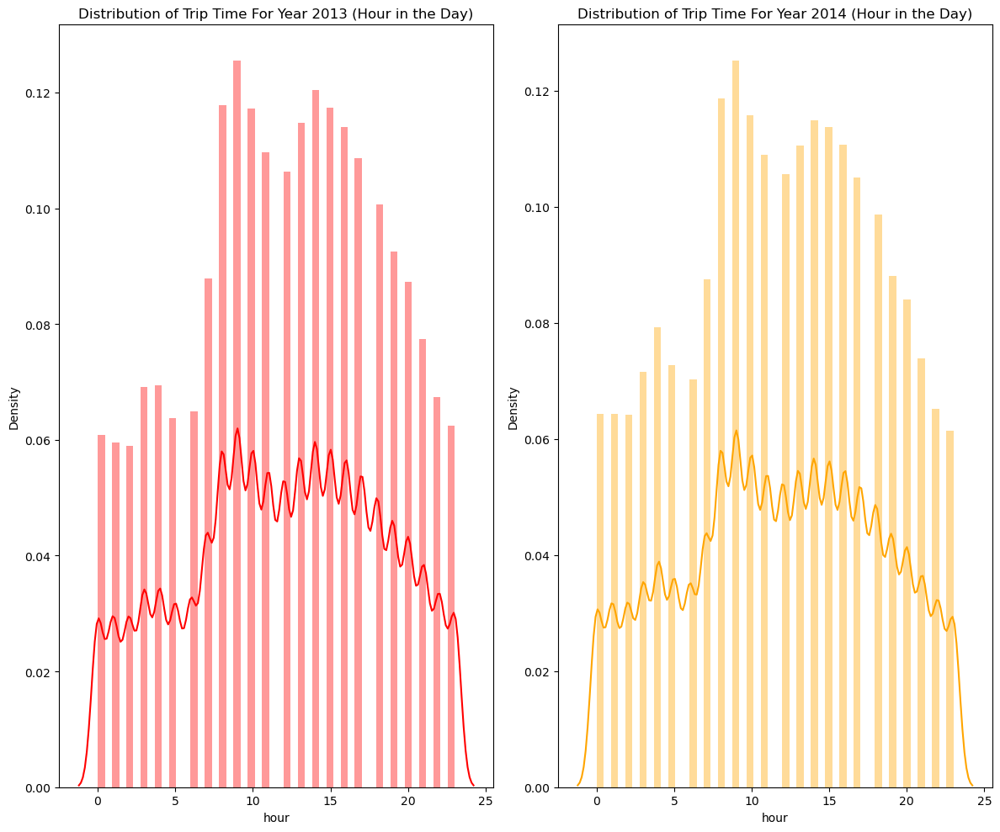

In [176]:
year = [2013, 2014]

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12, 10))
axs = axs.flatten()

colors = ["red", "orange"]
for i, year in enumerate(year):
    data2 = train_df.loc[train.year == year, :]
    sns.distplot(data2.hour, ax=axs[i], color=colors[i % 2])
    axs[i].set_title(f"Distribution of Trip Time For Year {year} (Hour in the Day)")

plt.tight_layout()
plt.show()


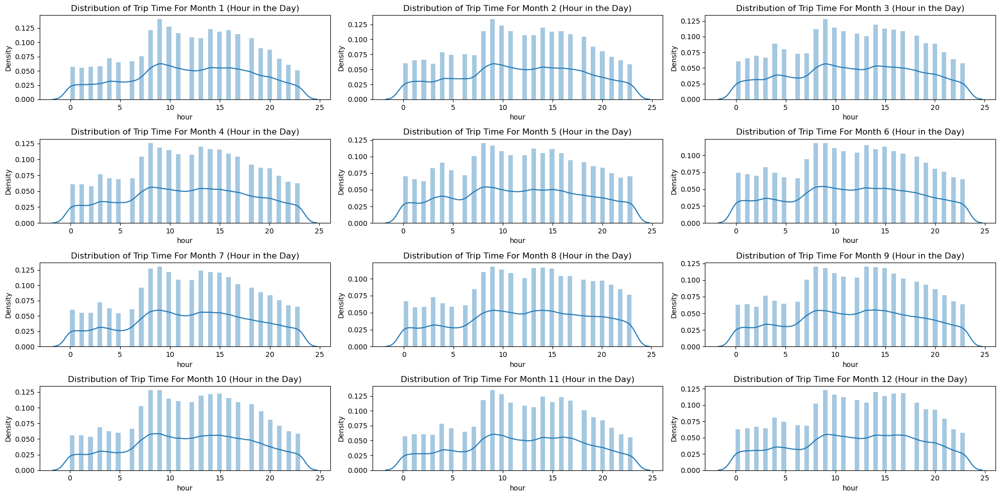

In [177]:
months = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(20, 10))
axs = axs.flatten()

for i, month in enumerate(months):

    data2 = train_df.loc[train_df.month == month, :].reset_index(drop=True)
    sns.distplot(data2.hour, ax=axs[i])
    axs[i].set_title(f"Distribution of Trip Time For Month {month} (Hour in the Day)")

plt.tight_layout()
plt.show()


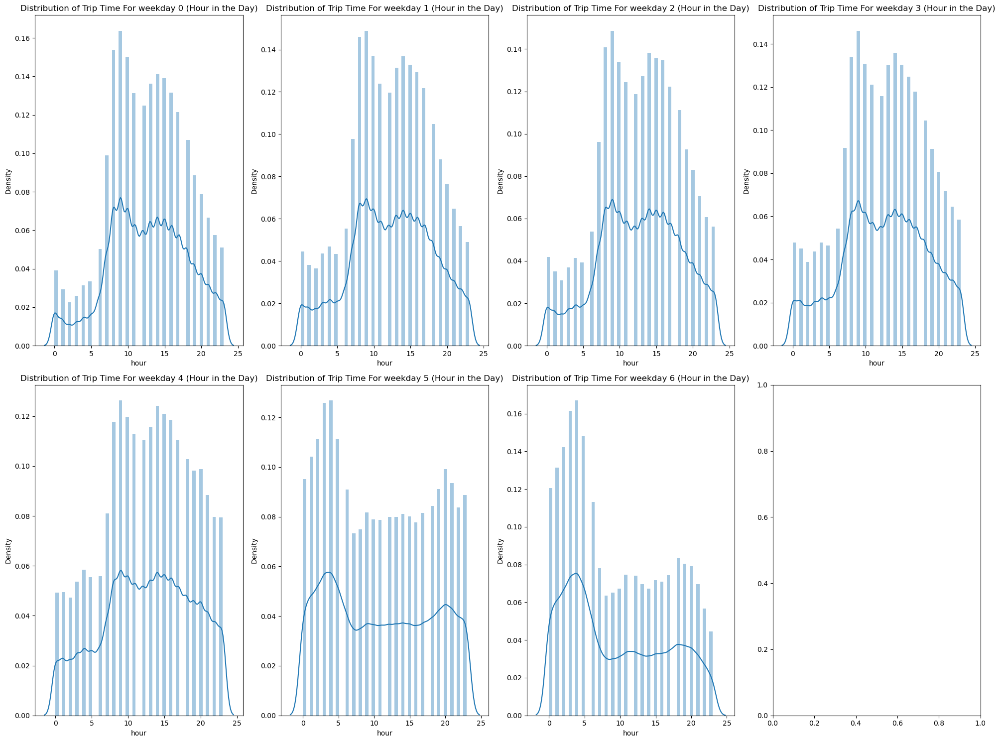

In [178]:
weekday = [0, 1, 2, 3, 4, 5, 6]

fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(20, 15))
axs = axs.flatten()

for i, day in enumerate(weekday):
    # Filter for each month observations and reset index
    data2 = train_df.loc[train_df.weekday == day, :]
    sns.distplot(data2.hour, ax=axs[i])
    axs[i].set_title(f"Distribution of Trip Time For weekday {day} (Hour in the Day)")

plt.tight_layout()
plt.show()


In [179]:
weekday = train_df.groupby(["weekday"])["TRIP_ID"].nunique().to_frame("Count").reset_index()

fig = px.bar(
    weekday,
    x="weekday",
    y="Count",
    hover_data=["Count"],
    color="Count",
    labels={"weekday": "Weekday"},
    height=400,
)
fig.show()


In [180]:
call_type = train.groupby(["CALL_TYPE"]).size().to_frame("Count").reset_index()

fig = px.bar(
    call_type,
    x="CALL_TYPE",
    y="Count",
    hover_data=["Count"],
    color="Count",
    labels={"weekday": "Weekday"},
    height=400,
)
fig.show()

### Correlation

In [181]:
num_cols = train_df.select_dtypes(include=["number"], exclude=["datetime", "timedelta"]).columns.tolist()
print(num_cols)

corr_matrix = np.array(train_df[num_cols].corr())
rounded_corr_matrix = [np.round(x, 4) for x in corr_matrix]

# Create a heatmap with annotations
fig = px.imshow(
    rounded_corr_matrix,
    x=num_cols,
    y=num_cols,
    labels=dict(x="X-axis", y="Y-axis", color="Correlation"),
    title="Heatmap with Annotations",
    text_auto=True,
    aspect="auto",
)

fig.show()

['CALL_TYPE_A', 'CALL_TYPE_B', 'CALL_TYPE_C', 'year', 'month', 'week', 'day', 'hour', 'min', 'lon_1st', 'lat_1st', 'lon_last', 'lat_last']


### Location

In [182]:
mapping_1st = pd.DataFrame(
    {
        "date": train_df.head(10000)["data_time"].values,
        "lat": train_df.head(10000)["lat_1st"].values,
        "lon": train_df.head(10000)["lon_1st"].values,
    }
)

mapping_last = pd.DataFrame(
    {
        "date": train_df.head(10000)["data_time"].values,
        "lat": train_df.head(10000)["lat_last"].values,
        "lon": train_df.head(10000)["lon_last"].values,
    }
)

por_map = folium.Map(location=[41.141412, -8.590324], tiles="Stamen Terrain", zoom_start=11)

for i, r in mapping_1st.iterrows():
    folium.CircleMarker(location=[r["lat"], r["lon"]], radius=0.5, color="red").add_to(por_map)

for i, r in mapping_last.iterrows():
    folium.CircleMarker(location=[r["lat"], r["lon"]], radius=0.5, color="blue").add_to(por_map)

por_map


### Modeling

In [183]:
train_df.assign(delta_lon = lambda x: train_df["lon_last"] - train_df["lon_1st"])
train_df.assign(delta_lat = lambda x: train_df["lat_last"] - train_df["lat_1st"])

,CALL_TYPE_A,CALL_TYPE_B,CALL_TYPE_C,TRIP_ID,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,MISSING_DATA,POLYLINE,data_time,...,week,day,hour,min,weekday,lon_1st,lat_1st,lon_last,lat_last,delta_lat
0,0,0,1,1372636858620000589,1,1,20000589,False,"[[-8.618643,41.141412],[-8.618499,41.141376],[...",2013-07-01 00:00:58+00:00,...,27,1,0,0,0,-8.618643,41.141412,-8.630838,41.154489,0.013077
1,0,1,0,1372637303620000596,1,0,20000596,False,"[[-8.639847,41.159826],[-8.640351,41.159871],[...",2013-07-01 00:08:23+00:00,...,27,1,0,8,0,-8.639847,41.159826,-8.665740,41.170671,0.010845
2,0,0,1,1372636951620000320,1,1,20000320,False,"[[-8.612964,41.140359],[-8.613378,41.14035],[-...",2013-07-01 00:02:31+00:00,...,27,1,0,2,0,-8.612964,41.140359,-8.615970,41.140530,0.000171
3,0,0,1,1372636854620000520,1,1,20000520,False,"[[-8.574678,41.151951],[-8.574705,41.151942],[...",2013-07-01 00:00:54+00:00,...,27,1,0,0,0,-8.574678,41.151951,-8.607996,41.142915,-0.009036
4,0,0,1,1372637091620000337,1,1,20000337,False,"[[-8.645994,41.18049],[-8.645949,41.180517],[-...",2013-07-01 00:04:51+00:00,...,27,1,0,4,0,-8.645994,41.180490,-8.687268,41.178087,-0.002403
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1710663,0,0,1,1388660427620000585,1,1,20000585,False,"[[-8.60697,41.162283],[-8.60697,41.16231],[-8....",2014-01-02 11:00:27+00:00,...,1,2,11,0,3,-8.606970,41.162283,-8.608158,41.162382,0.000099
1710665,0,0,1,1404171463620000698,1,1,20000698,False,"[[-8.612469,41.14602],[-8.612487,41.145993],[-...",2014-06-30 23:37:43+00:00,...,27,30,23,37,0,-8.612469,41.146020,-8.611344,41.171013,0.024993
1710666,0,0,1,1404171367620000670,1,1,20000670,False,"[[-8.610138,41.140845],[-8.610174,41.140935],[...",2014-06-30 23:36:07+00:00,...,27,30,23,36,0,-8.610138,41.140845,-8.627454,41.158755,0.017910
1710668,0,1,0,1404141826620000248,1,0,20000248,False,"[[-8.630712,41.154885],[-8.63073,41.154813],[-...",2014-06-30 15:23:46+00:00,...,27,30,15,23,0,-8.630712,41.154885,-8.587026,41.173524,0.018639


In [192]:
train_df.head()

,CALL_TYPE_A,CALL_TYPE_B,CALL_TYPE_C,TRIP_ID,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,MISSING_DATA,POLYLINE,data_time,...,month,week,day,hour,min,weekday,lon_1st,lat_1st,lon_last,lat_last
0,0,0,1,1372636858620000589,1,1,20000589,False,"[[-8.618643,41.141412],[-8.618499,41.141376],[...",2013-07-01 00:00:58+00:00,...,7,27,1,0,0,0,-8.618643,41.141412,-8.630838,41.154489
1,0,1,0,1372637303620000596,1,0,20000596,False,"[[-8.639847,41.159826],[-8.640351,41.159871],[...",2013-07-01 00:08:23+00:00,...,7,27,1,0,8,0,-8.639847,41.159826,-8.665740,41.170671
2,0,0,1,1372636951620000320,1,1,20000320,False,"[[-8.612964,41.140359],[-8.613378,41.14035],[-...",2013-07-01 00:02:31+00:00,...,7,27,1,0,2,0,-8.612964,41.140359,-8.615970,41.140530
3,0,0,1,1372636854620000520,1,1,20000520,False,"[[-8.574678,41.151951],[-8.574705,41.151942],[...",2013-07-01 00:00:54+00:00,...,7,27,1,0,0,0,-8.574678,41.151951,-8.607996,41.142915
4,0,0,1,1372637091620000337,1,1,20000337,False,"[[-8.645994,41.18049],[-8.645949,41.180517],[-...",2013-07-01 00:04:51+00:00,...,7,27,1,0,4,0,-8.645994,41.180490,-8.687268,41.178087


In [194]:
train_df['MISSING_DATA'] = (train_df["ORIGIN_CALL"] == 'False').astype(int)

In [195]:
ml_train = train_df[train_df.year == 2014]
ml_train.drop(["TRIP_ID", "TAXI_ID", "POLYLINE", "data_time", "min"], axis=1, inplace=True)
ml_train = ml_train.sample(136000)
ml_train.head()

,CALL_TYPE_A,CALL_TYPE_B,CALL_TYPE_C,ORIGIN_CALL,ORIGIN_STAND,MISSING_DATA,year,month,week,day,hour,weekday,lon_1st,lat_1st,lon_last,lat_last
1104134,0,0,1,1,1,0,2014,2,9,25,19,1,-8.599086,41.147838,-8.517222,41.157567
1611467,0,0,1,1,1,0,2014,6,24,11,7,2,-8.605215,41.125257,-8.610327,41.134383
1432607,0,0,1,1,1,0,2014,5,19,7,12,2,-8.602479,41.149125,-8.604360,41.150898
1598723,0,0,1,1,1,0,2014,6,23,8,4,6,-8.613639,41.146929,-8.614755,41.150124
1256611,1,0,0,0,1,0,2014,3,14,31,14,0,-8.620992,41.153193,-8.617383,41.167521


#### Test-train split

In [196]:
X = ml_train.drop(["lon_last", "lat_last"], axis=1)
y = ml_train[["lon_last","lat_last"]]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(95200, 14) (40800, 14) (95200, 2) (40800, 2)


In [204]:
lr_model = MultiOutputRegressor(LinearRegression(n_jobs=1))
forest_model = MultiOutputRegressor(RandomForestRegressor(n_estimators=100, random_state=1))
boosting_model = MultiOutputRegressor(GradientBoostingRegressor(random_state=0))
knn_model = MultiOutputRegressor(KNeighborsRegressor())
reg_model = MultiOutputRegressor(linear_model.Ridge())
dt_model = MultiOutputRegressor(DecisionTreeRegressor(max_depth=50, random_state=1))

all_res = pd.DataFrame()

for model in [lr_model, forest_model, boosting_model, knn_model, dt_model, reg_model]:
    model_fit = model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    print("Mean Square Error on training Data:{} ".format(mean_squared_error(y_train, y_train_pred)))
    print("Mean Square Error on testing Data:{} ".format(mean_squared_error(y_test, y_test_pred)))
    print("R2 score train:{} ".format(r2_score(y_train, y_train_pred)))
    print("R2 score test:{} ".format(r2_score(y_test, y_test_pred)))
    res = pd.DataFrame({
        "Model": [str(model).replace("MultiOutputRegressor(estimator=", "")] * 2,
        "Parameter": ["MSE", "R2"],
        "Train": [mean_squared_error(y_train, y_train_pred), r2_score(y_test, y_test_pred)],
        "Test": [r2_score(y_train, y_train_pred), mean_squared_error(y_test, y_test_pred)]
    })
    all_res = pd.concat([all_res, res], axis = 0)


Mean Square Error on training Data:0.0011991737690963014 
Mean Square Error on testing Data:0.0013332537936107743 
R2 score train:0.1825093725122276 
R2 score test:0.09542608592114377 
Mean Square Error on training Data:0.00020699611160609983 
Mean Square Error on testing Data:0.0014468768821630207 
R2 score train:0.8638063697619647 
R2 score test:0.019474569032679745 
Mean Square Error on training Data:0.0010694257457020372 
Mean Square Error on testing Data:0.0014182618944311141 
R2 score train:0.2666889367229377 
R2 score test:0.042193618975019165 
Mean Square Error on training Data:0.0011095540599701263 
Mean Square Error on testing Data:0.00164968606397029 
R2 score train:0.26966997549798016 
R2 score test:-0.11015015304864728 
Mean Square Error on training Data:5.211459800904103e-07 
Mean Square Error on testing Data:0.003284183594770439 
R2 score train:0.9996830239880083 
R2 score test:-1.1782716858204658 
Mean Square Error on training Data:0.0011992227555547871 
Mean Square Err

,Model,Parameter,Train,Test
0,LinearRegression(n_jobs=1)),MSE,1.199174e-03,0.182509
1,LinearRegression(n_jobs=1)),R2,9.542609e-02,0.001333
0,RandomForestRegressor(random_state=1)),MSE,2.069961e-04,0.863806
1,RandomForestRegressor(random_state=1)),R2,1.947457e-02,0.001447
0,GradientBoostingRegressor(random_state=0)),MSE,1.069426e-03,0.266689
1,GradientBoostingRegressor(random_state=0)),R2,4.219362e-02,0.001418
0,KNeighborsRegressor()),MSE,1.109554e-03,0.269670
1,KNeighborsRegressor()),R2,-1.101502e-01,0.001650
0,"DecisionTreeRegressor(max_depth=50,\n ...",MSE,5.211460e-07,0.999683
1,"DecisionTreeRegressor(max_depth=50,\n ...",R2,-1.178272e+00,0.003284


In [205]:
all_res.sort_values(["Parameter", "Test", "Train"])

,Model,Parameter,Train,Test
0,Ridge()),MSE,1.199223e-03,0.182474
0,LinearRegression(n_jobs=1)),MSE,1.199174e-03,0.182509
0,GradientBoostingRegressor(random_state=0)),MSE,1.069426e-03,0.266689
0,KNeighborsRegressor()),MSE,1.109554e-03,0.269670
0,RandomForestRegressor(random_state=1)),MSE,2.069961e-04,0.863806
0,"DecisionTreeRegressor(max_depth=50,\n ...",MSE,5.211460e-07,0.999683
1,Ridge()),R2,9.613912e-02,0.001332
1,LinearRegression(n_jobs=1)),R2,9.542609e-02,0.001333
1,GradientBoostingRegressor(random_state=0)),R2,4.219362e-02,0.001418
1,RandomForestRegressor(random_state=1)),R2,1.947457e-02,0.001447
